In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import json
import numpy as np
from openai import OpenAI

# Load existing chunks
with open("/content/drive/My Drive/master_thesis_project/met_biblipgraphy_chunks_chunk-size-300.json", "r", encoding="utf-8") as f:
    met_chunks = json.load(f)

print(f"Loaded {len(met_chunks)} chunks")

Loaded 1330400 chunks


In [ ]:
import random

def get_value(d, possible_keys, default="N/A"):
    """Helper to get metadata values from different key names."""
    for key in possible_keys:
        if key in d:
            return d[key]
        if "metadata" in d and key in d["metadata"]:
            return d["metadata"][key]
    return default


for i in range(3):
    random_index = random.randint(0, len(met_chunks) - 1)
    random_chunk = met_chunks[random_index]

    print(f"\n{'='*60}")
    print(f"RANDOM CHUNK #{i+1} (Global Index {random_index})")
    print(f"{'='*60}")

    # Default metadata
    source_file = "N/A"
    chunk_id = random_index

    if isinstance(random_chunk, dict):
        # Try to extract metadata fields
        source_file = get_value(
            random_chunk,
            ["source", "file_name", "filename", "document_id", "source_file"]
        )

        chunk_id = get_value(
            random_chunk,
            ["chunk_id", "id", "index"],
            default=random_index
        )

        print(f"Source file: {source_file}")
        print(f"Chunk ID:   {chunk_id}")

        # Print structure
        # print("\nStructure:", {k: type(v).__name__ for k, v in random_chunk.items()})

        # Try get actual text
        if "text" in random_chunk:
            text = random_chunk["text"]
        elif "content" in random_chunk:
            text = random_chunk["content"]
        else:
            # Fallback: print the first string value found
            text = None
            for key, value in random_chunk.items():
                if isinstance(value, str):
                    text = value
                    break

        if text:
            print("text: ", text)

    elif isinstance(random_chunk, str):
        print(f"Source file: {source_file}")
        print(f"Chunk ID:   {chunk_id}\n")
        print(random_chunk)

    print(f"Chunk type: {type(random_chunk)}\n")


# Dataset overview
print(f"\n=== Dataset Overview ===")
print(f"Total chunks: {len(met_chunks)}")

# Show structure of first few chunks
print("\nFirst 3 chunks types:")
for i in range(min(3, len(met_chunks))):
    print(f"  Chunk {i}: {type(met_chunks[i])}")

# Keys in dictionary chunks
if met_chunks and isinstance(met_chunks[0], dict):
    all_keys = set()
    for chunk in met_chunks[:10]:
        if isinstance(chunk, dict):
            all_keys.update(chunk.keys())
    print(f"\nCommon keys in chunks: {list(all_keys)}")


RANDOM CHUNK #1 (Global Index 772532)
Source file: A passion for antiquities _ ancient art from the collection of Barbara and Lawrence Fleischman - John Harris.pdf
Chunk ID:   1039
text:  seum 137:  CVA Austria).
BIBLIOGRAPHY:  Unpublished .
RELATED REFERENCES : H. Hoffmann,  Ten
Centuries That  Shaped the West  (Housto n
[?], 1971) , p. 3/8ff. , no. 175.  S. Drougou, De r
Attische  Psykter (Wiirzburg,  1975) , p. 19, no.
B3, pi. 13. i. K. Schauenburg , "Ein Psykter aus
Chunk type: <class 'dict'>


RANDOM CHUNK #2 (Global Index 707959)
Source file: House of the Surgeon, Pompeii _ Excavations in the Casa Del Chirurgo (VI 1, 9-10.23) - House of the Surgeon (Pompeii);Anderson, Michael Alan;Jones, Rick;Robinson, Damian.epub
Chunk ID:   3013
text:  606.011
) appears to have had a series of diagonal steps cut into its surface in rough alignment, not only with the cistern head in Room 3, but also the linear cuts from Rooms 3 and 4 and those recovered in Room 23 to the east (
Fig. 5.4.3
).
4.

In [ ]:
import json
import re
import random

def is_chunk_corrupted(chunk):
    """Check if a chunk contains corrupted/OCR garbage text"""
    if isinstance(chunk, dict) and 'text' in chunk:
        text = chunk['text']
    else:
        text = str(chunk)

    # Common indicators of corrupted OCR text
    corruption_indicators = [
        r'[a-zA-Z][0-9]+\.[a-zA-Z]',  # Mixed letters/numbers with dots (t1., H.2)
        r'\+[a-zA-Z]',  # Plus signs in words (+f, +b)
        r'[a-zA-Z]\)[a-zA-Z]',  # Parentheses in words (A&.C)
        r'&\.',  # Ampersand with dot (&.C)
        r'[><]\.[a-zA-Z]',  # Greater/less than with dots (>.d)
    ]

    # Count how many corruption patterns appear
    corruption_score = 0
    for pattern in corruption_indicators:
        if re.search(pattern, text):
            corruption_score += 1

    # If multiple corruption patterns found, consider it corrupted
    return corruption_score >= 2

def filter_corrupted_chunks(chunks):
    """Remove chunks that appear to be corrupted OCR text"""
    clean_chunks = []
    corrupted_chunks = []  # Store corrupted chunks for inspection

    for i, chunk in enumerate(chunks):
        if not is_chunk_corrupted(chunk):
            clean_chunks.append(chunk)
        else:
            corrupted_chunks.append(chunk)

    print(f"Removed {len(corrupted_chunks)} corrupted chunks")
    print(f"Kept {len(clean_chunks)} clean chunks")
    return clean_chunks, corrupted_chunks

# Apply filtering
with open("/content/drive/My Drive/master_thesis_project/met_biblipgraphy_chunks_chunk-size-300.json", "r", encoding="utf-8") as f:
    chunks = json.load(f)

clean_chunks, corrupted_chunks = filter_corrupted_chunks(chunks)

# Examine some corrupted chunks
print("\n=== EXAMINING CORRUPTED CHUNKS ===")
print(f"Total corrupted chunks: {len(corrupted_chunks)}")

if corrupted_chunks:
    # Look at some random corrupted chunks
    print("\nSample of corrupted chunks:")
    for i in range(min(5, len(corrupted_chunks))):
        corrupted_chunk = random.choice(corrupted_chunks)
        if isinstance(corrupted_chunk, dict) and 'text' in corrupted_chunk:
            print(f"\n--- Corrupted Chunk {i+1} ---")
            print(corrupted_chunk['text'][:500] + "..." if len(corrupted_chunk['text']) > 500 else corrupted_chunk['text'])
        else:
            print(f"\n--- Corrupted Chunk {i+1} (non-dict) ---")
            print(str(corrupted_chunk)[:500] + "..." if len(str(corrupted_chunk)) > 500 else str(corrupted_chunk))

    # Also show the first few corrupted chunks
    print("\n--- First 3 Corrupted Chunks ---")
    for i in range(min(3, len(corrupted_chunks))):
        corrupted_chunk = corrupted_chunks[i]
        if isinstance(corrupted_chunk, dict) and 'text' in corrupted_chunk:
            print(f"\nCorrupted Chunk #{i}:")
            print(corrupted_chunk['text'][:300] + "..." if len(corrupted_chunk['text']) > 300 else corrupted_chunk['text'])

Removed 1629 corrupted chunks
Kept 1328771 clean chunks

=== EXAMINING CORRUPTED CHUNKS ===
Total corrupted chunks: 1629

Sample of corrupted chunks:

--- Corrupted Chunk 1 ---
12.Bowl4. A. 11.41. Nicosia.
13.Bowlg.Corp. Vas. Ant.,GreatBritain2,Brit.Mus.2,
IICc, PI. 13.1. (Gr.Brit.57).
Fig.XXV.
Black-on-Red I(III)Ware.
I.Bowl6.A.5.27. Nicosia.
2.Bowl7 a.Cyp,Mus.,B. 1788. Nicosia.
3·Bowl7 b.L.4°2.36. Nicosia.
4.JarI. L,422.Dr.1. Stockholm.

--- Corrupted Chunk 2 ---
P1+t+  b)C.d  +, H(2m)2y  2005,48  f'5. 6.
t.m.,+'.  I, 1'C t.xt D. d.) Sy2')  (6), Lu('),  d.C(2'b.d  t1. )d+,)'  +f Byb&+C  )C f+&&+>C,
7 saw too at Byblos  a large temple,  sacred  to the Byblian  Aphrodite.  This is the scene

--- Corrupted Chunk 3 ---
14.6.5) ',d'()t.  t1)t Cyp2'+t.  )52'(u&tu2.  2.&'.d m)',&y  +, t1. (u&t'v)t'+,  +f Cu(1
b)C'( p2+du(tC  )C 52)',, 52)p.C  f+2 >',., ),d +&'v.C f+2 +'&. M)2',.  2.C+u2(.C  p&)y.d
) m',+2  .(+,+m'(  2+&.. F'C1 )2. 2)2.&y m.,t'+,.d  ', C+u2(.C  ),d t1.2. 'C ,+ .v'd.,(.

--- 

In [ ]:
# Save clean chunks
with open("/content/drive/My Drive/master_thesis_project/met_biblipgraphy_chunks_chunk-size-300_clean.json", "w", encoding="utf-8") as f:
    json.dump(clean_chunks, f, ensure_ascii=False, indent=2)

print(f"\nSaved {len(clean_chunks)} clean chunks")


Saved 1328771 clean chunks


## Filtering only the most relevant chunks for only 495 artefacts

In [ ]:
import re

def filter_with_terms(chunks, search_terms, min_matches=1):
    """Filter using academic terms, avoid duplicates efficiently."""

    relevant_indices = set()   # track unique indices
    relevant_chunks = []

    for i, chunk in enumerate(chunks):
        if i % 50000 == 0:
            print(f"Processed {i}/{len(chunks)} chunks...")

        if not (isinstance(chunk, dict) and 'text' in chunk):
            continue

        text_lower = chunk['text'].lower()

        matches = 0
        for term in search_terms:

            if " " in term:
                # multi-word term → simple substring match
                if term in text_lower:
                    matches += 1
            else:
                # single word → exact word match
                if re.search(r'\b' + re.escape(term) + r'\b', text_lower):
                    matches += 1

            if matches >= min_matches:
                if i not in relevant_indices:
                    relevant_indices.add(i)
                    relevant_chunks.append(chunk)
                break  # avoid adding same chunk again for other terms

    print(f"Found {len(relevant_chunks)} unique relevant chunks.")
    return relevant_chunks

In [ ]:
# Just use the most common and reliable terms
search_terms = [
    # Materials
    'terracotta', 'bronze', 'gold', 'silver', 'marble', 'limestone', 'glass',
    'clay', 'pottery', 'ceramic', 'ivory', 'amber', 'stone',

    # Cultures (root terms)
    'greek', 'roman', 'etruscan', 'egyptian', 'cypriot', 'phoenician',
    'lydian', 'italic', 'anatolian', 'aegean', 'mediterranean',

    # Categories
    'vase', 'vessel', 'sculpture', 'statuette', 'figure', 'jewelry',
    'coin', 'inscription', 'gem',
]

print(f"Using {len(search_terms)} core search terms")
relevant_chunks = filter_with_terms(clean_chunks, search_terms, min_matches=1)

Using 33 core search terms
Processed 0/1328771 chunks...
Processed 50000/1328771 chunks...
Processed 100000/1328771 chunks...
Processed 150000/1328771 chunks...
Processed 200000/1328771 chunks...
Processed 250000/1328771 chunks...
Processed 300000/1328771 chunks...
Processed 350000/1328771 chunks...
Processed 400000/1328771 chunks...
Processed 450000/1328771 chunks...
Processed 500000/1328771 chunks...
Processed 550000/1328771 chunks...
Processed 600000/1328771 chunks...
Processed 650000/1328771 chunks...
Processed 700000/1328771 chunks...
Processed 750000/1328771 chunks...
Processed 800000/1328771 chunks...
Processed 850000/1328771 chunks...
Processed 900000/1328771 chunks...
Processed 950000/1328771 chunks...
Processed 1000000/1328771 chunks...
Processed 1050000/1328771 chunks...
Processed 1100000/1328771 chunks...
Processed 1150000/1328771 chunks...
Processed 1200000/1328771 chunks...
Processed 1250000/1328771 chunks...
Processed 1300000/1328771 chunks...
Found 258792 unique relevan

In [ ]:
# Save relevant chunks
with open("/content/drive/My Drive/master_thesis_project/met_bibliography_chunks_relevant_filtered.json", "w", encoding="utf-8") as f:
    json.dump(relevant_chunks, f, ensure_ascii=False, indent=2)

print(f"\nSaved {len(relevant_chunks)} clean chunks")


Saved 258792 clean chunks


## Embeddings

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import json
import numpy as np
from openai import OpenAI

# Load existing chunks
with open("/content/drive/My Drive/master_thesis_project/met_bibliography_chunks_relevant_filtered.json", "r", encoding="utf-8") as f:
    met_chunks = json.load(f)

print(f"Loaded {len(met_chunks)} chunks")

Loaded 258792 chunks


In [ ]:
import random
import re

def get_meta_value(chunk, possible_keys, default="N/A"):
    """Return the first matching metadata value from either the chunk or chunk['metadata']."""
    for key in possible_keys:
        # First look at top-level keys
        if key in chunk:
            return chunk[key]
        # Then check nested metadata dictionary
        if "metadata" in chunk and isinstance(chunk["metadata"], dict):
            if key in chunk["metadata"]:
                return chunk["metadata"][key]
    return default


# Examine 3 random chunks
for i in range(3):
    random_index = random.randint(0, len(met_chunks) - 1)
    random_chunk = met_chunks[random_index]

    print(f"\n{'='*60}")
    print(f"RANDOM CHUNK #{i+1} (Global Index {random_index})")
    print(f"{'='*60}")

    if isinstance(random_chunk, dict):

        # ---- Extract source file ----
        source_file = get_meta_value(
            random_chunk,
            ["source_file", "source", "filename", "file_name", "document_id"]
        )

        # ---- Extract chunk id ----
        chunk_id = get_meta_value(
            random_chunk,
            ["chunk_id", "id", "index"],
            default=random_index
        )

        print(f"Source file: {source_file}")
        print(f"Chunk ID:    {chunk_id}")

        # ---- Show structure ----
        # print("\nStructure:", {k: type(v).__name__ for k, v in random_chunk.items()})

        # ---- Show text ----
        if 'text' in random_chunk:
            text = random_chunk['text']
        elif 'content' in random_chunk:
            text = random_chunk['content']
        else:
            # Fallback: first string found
            text = None
            for key, value in random_chunk.items():
                if isinstance(value, str):
                    text = value
                    break

        print("text: ", text)

    elif isinstance(random_chunk, str):
        print("Text preview:", random_chunk)

    print(f"\nChunk type: {type(random_chunk)}")
    print()


# ---- Dataset overview ----
print(f"\n=== Dataset Overview ===")
print(f"Total chunks: {len(met_chunks)}")

print("\nFirst 3 chunks types:")
for i in range(min(3, len(met_chunks))):
    print(f"  Chunk {i}: {type(met_chunks[i])}")

if met_chunks and isinstance(met_chunks[0], dict):
    all_keys = set()
    for chunk in met_chunks[:10]:
        if isinstance(chunk, dict):
            all_keys.update(chunk.keys())
    print(f"\nCommon keys found: {list(all_keys)}")


RANDOM CHUNK #1 (Global Index 112492)
Source file: Brill's New Pauly Encyclopaedia of the Ancient World (Sas-Syl) 13 - Hubert Cancik (editor), Helmuth Schneider (editor).pdf
Chunk ID:    6612
text:  numinous places such as sacred > groves, where the 
stillness of nature correlates with the silence of human 
beings. Ritual silence is called for in connection or alter- 
nation with prayers (~ Prayer, > Curse) as well as in 
Roman > sacrifice. In Roman worship ceremonial

Chunk type: <class 'dict'>


RANDOM CHUNK #2 (Global Index 244113)
Source file: The Greek Versions of the Testaments of the Twelve Patriarchs - Robert Henry Charles (ed.).pdf
Chunk ID:    3405
text:  same corruption in Prov. :πiii. r. Hence the clause = • waa aet free 
n"Om the lustful desire of the Egyptian woman.' 
ΙΧ. 1α, df. αlιe, & read πολλό«ιt, g ιca~ πολλώιιt, Α= πολλάιcιt yάp. 
Ι Α blι = ιcal λφι. Arιr om. A•b*c/J = El~ rήιι φvλαιcήιι, but here puι"L.,

Chunk type: <class 'dict'>


RANDOM CHUNK #3 (Global Index

In [ ]:
import json
import numpy as np
from tqdm import tqdm
import time
from openai import OpenAI

client = OpenAI(api_key="sk-xxxxxxx")

In [ ]:
def embed_chunks(chunks, emb_output_npy, meta_output_jsonl,
                 batch_size=200, retries=5):
    """Embed chunks using text-embedding-3-large and save efficiently."""

    # Extract texts + metadata
    chunk_texts = []
    metadata = []

    for chunk in chunks:
        if isinstance(chunk, dict) and 'text' in chunk:
            chunk_texts.append(chunk['text'])
            metadata.append({
                'source_file': chunk.get('source_file'),
                'chunk_id': chunk.get('chunk_id')
            })

    total = len(chunk_texts)
    print(f"Embedding {total:,} chunks with text-embedding-3-large")

    # Prepare storage
    embeddings = []

    # Batch loop
    for start in tqdm(range(0, total, batch_size)):
        end = start + batch_size
        batch = chunk_texts[start:end]

        # Retry logic
        for attempt in range(retries):
            try:
                response = client.embeddings.create(
                    model="text-embedding-3-large",
                    input=batch
                )
                vectors = [d.embedding for d in response.data]
                embeddings.extend(vectors)
                break
            except Exception as e:
                print(f"Error: {e} — retry {attempt+1}/{retries}")
                time.sleep(2)

    # Save embeddings efficiently
    embeddings_np = np.array(embeddings, dtype=np.float32) # NumPy arrays are standard for embeddings because they are efficient, compact, and easy to load into vector databases or FAISS for similarity search
    np.save(emb_output_npy, embeddings_np)

    # Save metadata
    with open(meta_output_jsonl, "w") as f:
        for m in metadata:
            f.write(json.dumps(m) + "\n")

    print(f"Saved embeddings to: {emb_output_npy}")
    print(f"Saved metadata to: {meta_output_jsonl}") # Each line contains info about the chunk:{"source_file": "book1.txt", "chunk_id": 123}, {"source_file": "book2.txt", "chunk_id": 456}

    return embeddings_np

In [ ]:
!mkdir -p "/content/drive/My Drive/master_thesis_project/RAG"

In [ ]:
embeddings_file = "/content/drive/My Drive/master_thesis_project/RAG/met_bibliography_embeddings_chunk-size-300.npy"
metadata_file = "/content/drive/My Drive/master_thesis_project/RAG/met_bibliography_embeddings_meta-chunk-size-300.jsonl"

emb = embed_chunks(met_chunks, embeddings_file, metadata_file)

Embedding 258,792 chunks with text-embedding-3-large


100%|██████████| 1294/1294 [41:55<00:00,  1.94s/it]


Saved embeddings to: /content/drive/My Drive/master_thesis_project/RAG/met_bibliography_embeddings_chunk-size-300.npy
Saved metadata to: /content/drive/My Drive/master_thesis_project/RAG/met_bibliography_embeddings_meta-chunk-size-300.jsonl


## RAG

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
import json
import openai
from PIL import Image
import base64
import io
import requests
from typing import Optional, List, Dict, Tuple
import numpy as np
import hashlib
import torch
from tqdm import tqdm

In [3]:
class Config:
    # OpenAI embedding configuration
    EMBEDDING_MODEL = "text-embedding-3-large"

    # RAG configurations
    BIBLIOGRAPHY_EMBEDDINGS_NPY = "/content/drive/My Drive/master_thesis_project/RAG/met_bibliography_embeddings_chunk-size-300.npy"
    BIBLIOGRAPHY_METADATA_JSONL = "/content/drive/My Drive/master_thesis_project/RAG/met_bibliography_embeddings_meta-chunk-size-300.jsonl"
    ORIGINAL_CHUNKS_FILE = "/content/drive/My Drive/master_thesis_project/met_bibliography_chunks_relevant_filtered.json"

    # Model configurations
    # GENERATION_MODEL = "gpt-4o-2024-08-06"
    CLASSIFIER_MODEL = os.getenv("CLASSIFIER_MODEL", "ft:gpt-4o-2024-08-06:university-of-zurich-department-of-history:artefacts-met-v3:CdFToJDn")
    DESCRIBER_MODEL = os.getenv("DESCRIBER_MODEL", "ft:gpt-4o-2024-08-06:university-of-zurich-department-of-history:artefacts-met-v2:CaNx0s5C")

    # API Key
    API_KEY = "sk-xxxxxxxx"  # For GPT-4o generation only

In [4]:
class OpenAIEmbedder:
    def __init__(self, model_name: str = "text-embedding-3-large", api_key: str = None):
        self.model_name = model_name
        self.embedding_dimension = 3072  # text-embedding-3-large has 3072 dimensions
        self.client = openai.OpenAI(api_key=api_key)

    def get_text_embedding(self, text: str) -> Optional[List[float]]:
        """Get embedding for text using OpenAI"""
        try:
            response = self.client.embeddings.create(
                model=self.model_name,
                input=[text]
            )
            return response.data[0].embedding
        except Exception as e:
            print(f"OpenAI text embedding error: {e}")
            return None

    def get_image_embedding(self, image: Image.Image) -> Optional[List[float]]:
        """NEW: Generate description from image first, then embed the description"""
        try:
            # Step 1: Use GPT-4o to describe the image
            base64_image = self.image_to_base64(image)

            response = self.client.chat.completions.create(
                model="gpt-4o",
                messages=[
                    {
                        "role": "user",
                        "content": [
                            {
                                "type": "text",
                                "text": "Describe this archaeological artifact in detail including form, decoration, materials visible, and condition. Focus on features that would help find its relevant information in academic literature."
                            },
                            {
                                "type": "image_url",
                                "image_url": {"url": f"data:image/jpeg;base64,{base64_image}", "detail": "low"}
                            }
                        ]
                    }
                ],
                max_tokens=500
            )

            description = response.choices[0].message.content
            print(f"Generated description for embedding: {description}")

            # Step 2: Embed the description
            return self.get_text_embedding(description)

        except Exception as e:
            print(f"OpenAI image embedding error: {e}")
            return None

    def image_to_base64(self, image) -> str:
        """Convert PIL Image to base64 string"""
        buffered = io.BytesIO()
        if image.mode in ('RGBA', 'LA', 'P'):
            image = image.convert('RGB')
        image.save(buffered, format="JPEG", quality=85)
        return base64.b64encode(buffered.getvalue()).decode()

In [5]:
class MultimodalRAG:
    def __init__(self, config):
        self.config = config

        # Initialize OpenAI embedder
        self.embedder = OpenAIEmbedder(config.EMBEDDING_MODEL, config.API_KEY)
        self.embedding_dimension = self.embedder.embedding_dimension

        # Initialize OpenAI client for both fine-tuned models
        if config.API_KEY:
            self.client = openai.OpenAI(api_key=config.API_KEY)
        else:
            raise ValueError("Please set your OpenAI API key in the Config class")

        # Load pre-computed bibliography embeddings
        print("Loading pre-computed bibliography embeddings...")
        self.bibliography_embeddings = np.load(config.BIBLIOGRAPHY_EMBEDDINGS_NPY)

        # Load metadata and create mapping
        print("Loading metadata and creating chunk_id mapping...")
        self.bibliography_metadata = []
        self.chunk_id_to_index = {}  # Maps chunk_id -> embedding index

        with open(config.BIBLIOGRAPHY_METADATA_JSONL, 'r') as f:
            for line_num, line in enumerate(f):
                metadata = json.loads(line)
                self.bibliography_metadata.append(metadata)

                # Store mapping from chunk_id to embedding index
                chunk_id = metadata.get('chunk_id')
                if chunk_id is not None:
                    self.chunk_id_to_index[chunk_id] = line_num

        # Load original chunks and create text mapping
        print("Loading original chunks file...")
        with open(config.ORIGINAL_CHUNKS_FILE, "r", encoding="utf-8") as f:
            self.original_chunks = json.load(f)

        # Create mapping from chunk_id to text content
        self.chunk_id_to_text = {}
        for chunk in self.original_chunks:
            if isinstance(chunk, dict):
                chunk_id = chunk.get('chunk_id')
                text = chunk.get('text')
                if chunk_id is not None and text is not None:
                    self.chunk_id_to_text[chunk_id] = text

        print(f"Loaded {len(self.bibliography_embeddings)} bibliography embeddings")
        print(f"Loaded {len(self.original_chunks)} original chunks")
        print(f"Created mapping for {len(self.chunk_id_to_index)} chunk_ids to embeddings")
        print(f"Created mapping for {len(self.chunk_id_to_text)} chunk_ids to texts")
        print(f"Using OpenAI {config.EMBEDDING_MODEL} with {self.embedding_dimension} dimensions")

        # Verify the mapping
        self._verify_mapping()

    def _verify_mapping(self):
        """Verify that we can map between embeddings and texts properly"""
        successful_mappings = 0
        total_embeddings = len(self.bibliography_embeddings)

        for i, metadata in enumerate(self.bibliography_metadata[:100]):  # Check first 100
            chunk_id = metadata.get('chunk_id')
            if chunk_id and chunk_id in self.chunk_id_to_text:
                successful_mappings += 1

        print(f"Mapping verification: {successful_mappings}/100 embeddings successfully mapped to texts")

        if successful_mappings < 90:
            print("WARNING: Many embeddings cannot be mapped to text content!")

    def get_chunk_text(self, chunk_index: int) -> str:
        """Get the actual text content for a chunk using chunk_id mapping"""
        try:
            if 0 <= chunk_index < len(self.bibliography_metadata):
                # Get metadata for this embedding index
                metadata = self.bibliography_metadata[chunk_index]
                chunk_id = metadata.get('chunk_id')

                if chunk_id and chunk_id in self.chunk_id_to_text:
                    return self.chunk_id_to_text[chunk_id]
                else:
                    return f"Chunk ID {chunk_id} not found in original chunks"
            else:
                return f"Chunk index {chunk_index} out of range"

        except Exception as e:
            print(f"Error getting chunk text for index {chunk_index}: {e}")
            return f"Error loading chunk text"

    def check_database_status(self):
        """Check database status"""
        print("Database Status:")
        print(f"   Bibliography embeddings: {len(self.bibliography_embeddings)}")
        print(f"   Original chunks loaded: {len(self.original_chunks)}")
        print(f"   Embedding dimension: {self.embedding_dimension}")

        return {
            'bibliography_count': len(self.bibliography_embeddings),
            'original_chunks_count': len(self.original_chunks),
            'embedding_dimension': self.embedding_dimension
        }

    def image_to_base64(self, image: Image.Image) -> str:
        """Convert PIL Image to base64 string"""
        buffered = io.BytesIO()
        if image.mode in ('RGBA', 'LA', 'P'):
            image = image.convert('RGB')
        image.save(buffered, format="JPEG", quality=85)
        return base64.b64encode(buffered.getvalue()).decode()

    def load_image(self, image_source: str) -> Image.Image:
        """Load image from file path or URL"""
        try:
            if isinstance(image_source, Image.Image):
                return image_source
            elif image_source.startswith(('http://', 'https://')):
                print(f"Loading image from URL: {image_source}")
                response = requests.get(image_source, timeout=30)
                response.raise_for_status()
                return Image.open(io.BytesIO(response.content))
            else:
                print(f"Loading image from file: {image_source}")
                return Image.open(image_source)
        except Exception as e:
            print(f"Error loading image: {e}")
            raise ValueError(f"Could not load image from source: {image_source}")

    def classify_with_fine_tuned(self, images: List[Image.Image], context: str) -> str:
        """Use fine-tuned classifier model for artifact classification - exact training format"""
        try:
            base64_images = [self.image_to_base64(img) for img in images]

            image_contents = []
            for base64_img in base64_images:
                image_contents.append({
                    "type": "image_url",
                    "image_url": {"url": f"data:image/jpeg;base64,{base64_img}", "detail": "low"}
                })

            response = self.client.chat.completions.create(
                model=self.config.CLASSIFIER_MODEL,
                messages=[
                    {
                        "role": "system",
                        "content": "You are a museum curator who creates precise and academically accurate metadata for archaeological artifacts in English."
                    },
                    {
                        "role": "user",
                        "content": [
                            *image_contents,
                            {
                                "type": "text",
                                "text": f"""Database Context:
{context}

Please provide the metadata (Material, Culture, Category) for this artifact."""
                            }
                        ]
                    }
                ],
                max_tokens=500,
                temperature=0.1
            )

            classification_result = response.choices[0].message.content
            print(f"Classifier raw output: {classification_result}")
            return classification_result

        except Exception as e:
            print(f"Classifier model error: {e}")
            return "Material: Unknown\nCulture: Unknown\nCategory: Unknown"

    def describe_with_fine_tuned(self, images: List[Image.Image], context: str, classification: str) -> str:
        """Use fine-tuned describer model for detailed artifact description - exact training format"""
        try:
            base64_images = [self.image_to_base64(img) for img in images]

            image_contents = []
            for base64_img in base64_images:
                image_contents.append({
                    "type": "image_url",
                    "image_url": {"url": f"data:image/jpeg;base64,{base64_img}", "detail": "low"}
                })

            response = self.client.chat.completions.create(
                model=self.config.DESCRIBER_MODEL,
                messages=[
                    {
                        "role": "system",
                        "content": "You are a museum curator who creates precise and academically accurate descriptions of archaeological artifacts in English. Use a formal, scholarly style appropriate for museum catalogs."
                    },
                    {
                        "role": "user",
                        "content": [
                            *image_contents,
                            {
                                "type": "text",
                                "text": "Please provide a detailed description for this artifact."
                            }
                        ]
                    }
                ],
                max_tokens=1000,
                temperature=0.3
            )

            description_result = response.choices[0].message.content
            print(f"Describer raw output: {description_result}")
            return description_result

        except Exception as e:
            print(f"Describer model error: {e}")
            return "Description could not be generated."

    def parse_classification_result(self, classification_text: str) -> Dict[str, str]:
        """Parse the structured classification output into a dictionary"""
        try:
            result = {}
            lines = classification_text.split('\n')

            for line in lines:
                if ':' in line:
                    key, value = line.split(':', 1)
                    key = key.strip()
                    value = value.strip()
                    if key in ['Material', 'Culture', 'Category']:
                        result[key] = value

            # Ensure all required fields are present
            for field in ['Material', 'Culture', 'Category']:
                if field not in result:
                    result[field] = 'Unknown'

            return result
        except Exception as e:
            print(f"Error parsing classification: {e}")
            return {'Material': 'Unknown', 'Culture': 'Unknown', 'Category': 'Unknown'}

    def process_with_fine_tuned_models(self, image_sources: List[str], text_query: str) -> Dict:
        """Process using both fine-tuned models with exact training formats"""
        try:
            images = [self.load_image(source) for source in image_sources]
            print(f"Processing {len(images)} images with fine-tuned models...")

            # Retrieve relevant context
            relevant_texts = self.rank_based_retrieve(images, text_query)
            print(f"Found {len(relevant_texts)} relevant text passages")

            # Build context
            context_parts = []
            if relevant_texts:
                filtered_texts = [text for text in relevant_texts if text['similarity'] >= 0.7]

                if filtered_texts:
                    context_parts.append("RELEVANT INFORMATION FROM THE KNOWLEDGE BASE:")
                    top_results = filtered_texts[:8]

                    for i, text in enumerate(top_results):
                        context_parts.append(f"[Rank {text['rank']}, Similarity: {text['similarity']:.3f}] {text['content']}")

                    print(f"Using {len(top_results)} high-quality text passages")
                else:
                    context_parts.append("No high-quality matches found in the knowledge base.")
            else:
                context_parts.append("No relevant information found in the knowledge base.")

            context = "\n".join(context_parts)

            # Step 1: Classification with fine-tuned model
            print("Classifying artifact with fine-tuned model...")
            classification_raw = self.classify_with_fine_tuned(images, context)
            classification_parsed = self.parse_classification_result(classification_raw)

            # Step 2: Description with fine-tuned model
            print("Creating description with fine-tuned model...")
            description = self.describe_with_fine_tuned(images, context, classification_raw)

            # Format final output
            final_answer = f"""## Classification
Material: {classification_parsed['Material']}
Culture: {classification_parsed['Culture']}
Category: {classification_parsed['Category']}

## Detailed Description
{description}"""

            return {
                'images_processed': len(images),
                'final_answer': final_answer,
                'classification': classification_parsed,
                'description': description,
                'retrieved_sources': relevant_texts,
                'retrieval_stats': {
                    'total_matches': len(relevant_texts),
                    'high_quality_matches': len(filtered_texts) if relevant_texts else 0,
                    'sources_used': len(top_results) if filtered_texts else 0,
                },
                'success': True
            }

        except Exception as e:
            print(f"Error processing query: {e}")
            return {
                'error': str(e),
                'success': False,
                'images_processed': 0
            }

    def rank_based_retrieve(self, images: List[Image.Image], text_query: str = "") -> List[Dict]:
        """Retrieval using OpenAI embeddings and PROPER cosine similarity"""
        all_results = []

        # ONLY use the FIRST image for embedding and similarity search
        if images:
            try:
                first_image = images[0]
                image_embedding = self.embedder.get_image_embedding(first_image)

                if image_embedding is not None:
                    image_embedding_np = np.array(image_embedding)

                    # NORMALIZE FOR COSINE SIMILARITY
                    query_norm = image_embedding_np / np.linalg.norm(image_embedding_np)
                    bibliography_norm = self.bibliography_embeddings / np.linalg.norm(self.bibliography_embeddings, axis=1, keepdims=True)

                    # Calculate cosine similarities
                    similarities = np.dot(bibliography_norm, query_norm)

                    # Get top 25 results
                    top_indices = np.argsort(similarities)[-25:][::-1]

                    print(f"First image: Found {len(top_indices)} potential matches")

                    for rank, idx in enumerate(top_indices):
                        similarity = similarities[idx]
                        chunk_text = self.get_chunk_text(idx)
                        metadata = self.bibliography_metadata[idx]
                        source_file = metadata.get('source_file', 'unknown')

                        all_results.append({
                            'content': chunk_text,
                            'similarity': float(similarity),
                            'image_source': "first_image",
                            'metadata': self.bibliography_metadata[idx],
                            'rank': rank + 1,
                            'chunk_id': idx,
                            'source_file': source_file
                        })

                        if rank < 3:
                            print(f"   Rank {rank+1}: Cosine Similarity={similarity:.3f}, Source: {source_file}")
                            print(f"   Text: {chunk_text}")
                else:
                    print("First image embedding failed, skipping image-based retrieval")

            except Exception as e:
                print(f"Error processing first image for retrieval: {e}")

        # Also search with text query (with normalization)
        if text_query:
            try:
                text_embedding = self.embedder.get_text_embedding(text_query)
                if text_embedding:
                    text_embedding_np = np.array(text_embedding)

                    # NORMALIZE FOR COSINE SIMILARITY
                    query_norm = text_embedding_np / np.linalg.norm(text_embedding_np)
                    bibliography_norm = self.bibliography_embeddings / np.linalg.norm(self.bibliography_embeddings, axis=1, keepdims=True)

                    similarities = np.dot(bibliography_norm, query_norm)
                    top_indices = np.argsort(similarities)[-15:][::-1]

                    print(f"Text query: Found {len(top_indices)} potential matches")

                    for rank, idx in enumerate(top_indices):
                        similarity = similarities[idx]
                        chunk_text = self.get_chunk_text(idx)
                        metadata = self.bibliography_metadata[idx]
                        source_file = metadata.get('source_file', 'unknown')

                        all_results.append({
                            'content': chunk_text,
                            'similarity': float(similarity),
                            'image_source': "text_query",
                            'metadata': self.bibliography_metadata[idx],
                            'rank': rank + 1,
                            'chunk_id': idx,
                            'source_file': source_file
                        })
            except Exception as e:
                print(f"Error in text retrieval: {e}")

        # Remove duplicates and return
        unique_results = {}
        for result in all_results:
            content_hash = hashlib.md5(result['content'].encode()).hexdigest()
            if content_hash not in unique_results or result['similarity'] > unique_results[content_hash]['similarity']:
                unique_results[content_hash] = result

        sorted_results = sorted(unique_results.values(), key=lambda x: x['similarity'], reverse=True)
        print(f"Final retrieval: {len(sorted_results)} unique results")

        return sorted_results

In [ ]:
# Initialize the system
config = Config()
rag = MultimodalRAG(config)

# Check status
status = rag.check_database_status()
print(f"Ready with {status['bibliography_count']} bibliography embeddings")

Loading pre-computed bibliography embeddings...
Loading metadata and creating chunk_id mapping...
Loading original chunks file...
Loaded 258792 bibliography embeddings
Loaded 258792 original chunks
Created mapping for 17366 chunk_ids to embeddings
Created mapping for 17366 chunk_ids to texts
Using OpenAI text-embedding-3-large with 3072 dimensions
Mapping verification: 99/100 embeddings successfully mapped to texts
Database Status:
   Bibliography embeddings: 258792
   Original chunks loaded: 258792
   Embedding dimension: 3072
Ready with 258792 bibliography embeddings


In [ ]:
# test 1: prompt + met images
config = Config()
rag = MultimodalRAG(config)

image_sources = [
    "/content/drive/My Drive/master_thesis_project/met_images/856618_primary.jpg",
    "/content/drive/My Drive/master_thesis_project/met_images/856618_additional_1.jpg"
]

text_query = "Please provide the metadata (Material, Culture, Category) and a detailed description for this artifact."

print("Testing rank-based retrieval...")
result = rag.process_with_fine_tuned_models(image_sources, text_query)

print("\n" + "="*60)
print("FINAL ANALYSIS:")
print("="*60)
print(result['final_answer'])
print(f"\nStatistics: {result['retrieval_stats']['total_matches']} texts found, {result['retrieval_stats']['sources_used']} used")

Loading pre-computed bibliography embeddings...
Loading metadata and creating chunk_id mapping...
Loading original chunks file...
Loaded 258792 bibliography embeddings
Loaded 258792 original chunks
Created mapping for 17366 chunk_ids to embeddings
Created mapping for 17366 chunk_ids to texts
Using OpenAI text-embedding-3-large with 3072 dimensions
Mapping verification: 99/100 embeddings successfully mapped to texts
Testing rank-based retrieval...
Loading image from file: /content/drive/My Drive/master_thesis_project/met_images/856618_primary.jpg
Loading image from file: /content/drive/My Drive/master_thesis_project/met_images/856618_additional_1.jpg
Processing 2 images with fine-tuned models...
Generated description for embedding: The artifact is a terracotta figurine likely representing a female form. It appears to have a columnar shape, tapering slightly towards the base. The figure has an elaborate coiffure or headdress, topped with what resembles a crown, which is accentuated with 

✅ Image 1: (3000, 4000) pixels, RGB mode
✅ Image 2: (3000, 4000) pixels, RGB mode


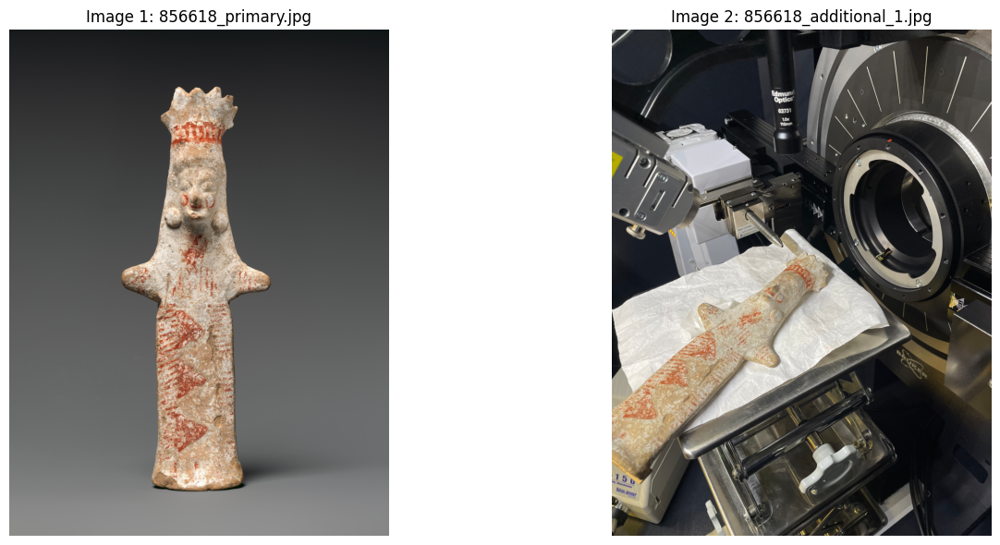

In [ ]:
from IPython.display import Image as IPythonImage, display
import matplotlib.pyplot as plt

image_sources = [
    "/content/drive/My Drive/master_thesis_project/met_images/856618_primary.jpg",
    "/content/drive/My Drive/master_thesis_project/met_images/856618_additional_1.jpg"
]

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

for i, image_path in enumerate(image_sources):
    try:
        img = IPythonImage.open(image_path)
        axes[i].imshow(img)
        axes[i].axis('off')
        axes[i].set_title(f"Image {i+1}: {image_path.split('/')[-1]}", fontsize=12)

        print(f"✅ Image {i+1}: {img.size} pixels, {img.mode} mode")

    except Exception as e:
        print(f"❌ Error loading {image_path}: {e}")
        axes[i].text(0.5, 0.5, f"Error loading image",
                    ha='center', va='center', transform=axes[i].transAxes)
        axes[i].axis('off')

plt.tight_layout()
plt.show()

Ground truth:   
title: Statuette of a standing goddess    
terracotta    
ca. 525–500 BC    
Greek, Boeotian    
Terracottas   
Colorful details painted on a white slip accentuate the elaborate makeup, accessories, and drapery adorning this female figure. Yellow ocher applied to the headdress, earrings, and garment evokes gold, and red ocher painted on her neck probably depicts a necklace of pomegranates, a symbol of death and rebirth. The headdress with rays suggests the woman is a goddess, perhaps Persephone, queen of the Underworld. Discovered primarily in graves, statuettes of this type may have been intended specifically for funerary use.

In [ ]:
# test 2: another prompt and test with single image
config = Config()
rag = MultimodalRAG(config)

# Test the new rank-based approach
image_sources = [
    "/content/drive/My Drive/master_thesis_project/met_images/776256_primary.jpg",
]

text_query = "Please provide the metadata (Material, Culture, Category) and a detailed description for this artifact."

print("Testing rank-based retrieval...")
result = rag.process_with_fine_tuned_models(image_sources, text_query)

print("\n" + "="*60)
print("FINAL ANALYSIS:")
print("="*60)
print(result['final_answer'])
print(f"\nStatistics: {result['retrieval_stats']['total_matches']} texts found, {result['retrieval_stats']['sources_used']} used")

Loading pre-computed bibliography embeddings...
Loading metadata and creating chunk_id mapping...
Loading original chunks file...
Loaded 258792 bibliography embeddings
Loaded 258792 original chunks
Created mapping for 17366 chunk_ids to embeddings
Created mapping for 17366 chunk_ids to texts
Using OpenAI text-embedding-3-large with 3072 dimensions
Mapping verification: 99/100 embeddings successfully mapped to texts
Testing rank-based retrieval...
Loading image from file: /content/drive/My Drive/master_thesis_project/met_images/776256_primary.jpg
Processing 1 images with fine-tuned models...
Generated description for embedding: The image shows two metal rings on a gridded background with a color scale and measurement tool, likely for documentation purposes. Here’s a detailed description:

### Form:
- **Left Ring**: Larger, roughly circular shape with a slightly irregular form, indicating possible handmade craftsmanship or wear.
- **Right Ring**: Smaller and more uniform, circular in sha

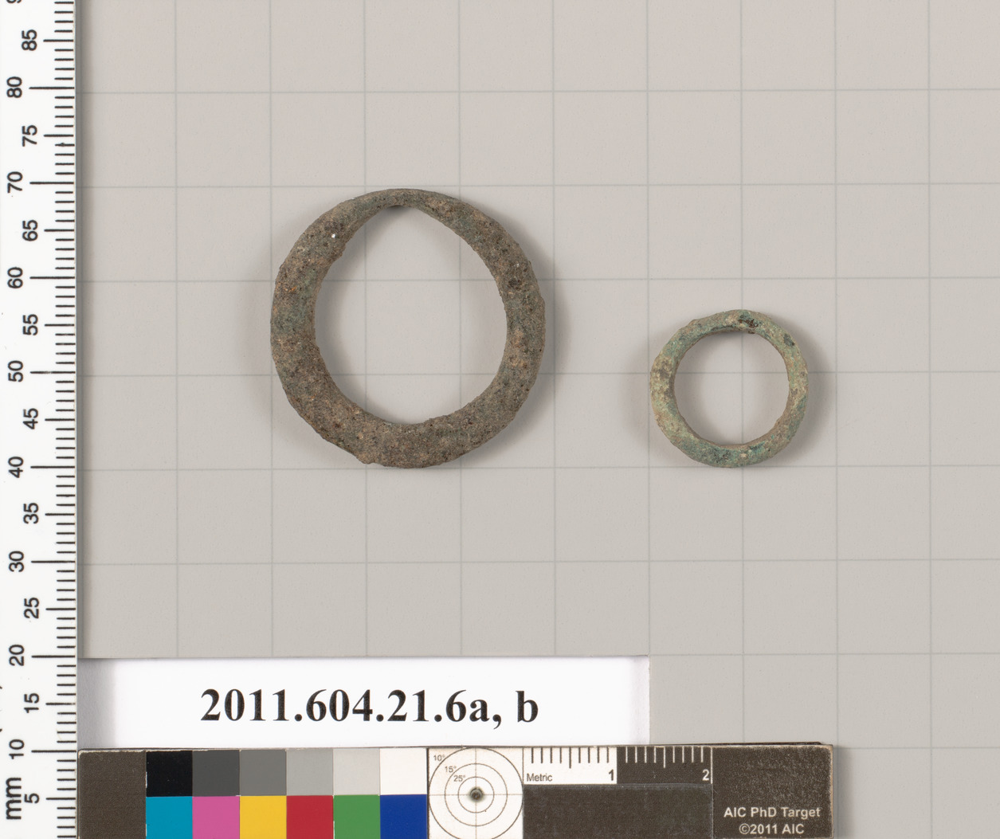

In [ ]:
from IPython.display import Image as IPythonImage, display

image_path = "/content/drive/My Drive/master_thesis_project/met_images/776256_primary.jpg"

# This definitely works in Colab
display(IPythonImage(filename=image_path, width=600))

ground truth:   
  
material: Bronze.   
culture: Archaic/Classical.
category:Bronzes.    

description: Two bronze rings

In [ ]:
# test 3: prompt + met images
config = Config()
rag = MultimodalRAG(config)

image_sources = [
    "/content/drive/My Drive/master_thesis_project/met_images/330140_primary.jpg",
    "/content/drive/My Drive/master_thesis_project/met_images/330140_additional_0.jpg",
    "/content/drive/My Drive/master_thesis_project/met_images/330140_additional_1.jpg",
    "/content/drive/My Drive/master_thesis_project/met_images/330140_additional_2.jpg"
]

text_query = "Please provide the metadata (Material, Culture, Category) and a detailed description for this artifact."

print("Testing rank-based retrieval...")
result = rag.process_with_fine_tuned_models(image_sources, text_query)

print("\n" + "="*60)
print("FINAL ANALYSIS:")
print("="*60)
print(result['final_answer'])
print(f"\nStatistics: {result['retrieval_stats']['total_matches']} texts found, {result['retrieval_stats']['sources_used']} used")

Loading pre-computed bibliography embeddings...
Loading metadata and creating chunk_id mapping...
Loading original chunks file...
Loaded 258792 bibliography embeddings
Loaded 258792 original chunks
Created mapping for 17366 chunk_ids to embeddings
Created mapping for 17366 chunk_ids to texts
Using OpenAI text-embedding-3-large with 3072 dimensions
Mapping verification: 99/100 embeddings successfully mapped to texts
Testing rank-based retrieval...
Loading image from file: /content/drive/My Drive/master_thesis_project/met_images/330140_primary.jpg
Loading image from file: /content/drive/My Drive/master_thesis_project/met_images/330140_additional_0.jpg
Loading image from file: /content/drive/My Drive/master_thesis_project/met_images/330140_additional_1.jpg
Loading image from file: /content/drive/My Drive/master_thesis_project/met_images/330140_additional_2.jpg
Processing 4 images with fine-tuned models...
Generated description for embedding: This artifact is a gold coin, likely ancient an

In [ ]:
from IPython.display import display, Image as IPythonDisplayImage
import matplotlib.pyplot as plt
from PIL import Image  # Add this import for actual image processing

image_sources = [
    "/content/drive/My Drive/master_thesis_project/met_images/330140_primary.jpg",
    "/content/drive/My Drive/master_thesis_project/met_images/330140_additional_0.jpg",
    "/content/drive/My Drive/master_thesis_project/met_images/330140_additional_1.jpg",
    "/content/drive/My Drive/master_thesis_project/met_images/330140_additional_2.jpg"
]

# Create subplots for 4 images (2 rows, 2 columns)
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# Flatten the 2x2 axes array to make it easier to iterate
axes = axes.flatten()

for i, image_path in enumerate(image_sources):
    try:
        # Use PIL Image to open and process the image
        img = Image.open(image_path)
        axes[i].imshow(img)
        axes[i].axis('off')
        axes[i].set_title(f"Image {i+1}: {image_path.split('/')[-1]}", fontsize=12)

        print(f"✅ Image {i+1}: {img.size} pixels, {img.mode} mode")

    except Exception as e:
        print(f"❌ Error loading {image_path}: {e}")
        axes[i].text(0.5, 0.5, f"Error loading image",
                    ha='center', va='center', transform=axes[i].transAxes)
        axes[i].axis('off')

plt.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.

ground truth:    
Gold stater   
Gold   
ca. 330–320 BC   
Greek, Macedon
Coins    
Alexander the Great’s principal numismatic achievement was to put into circulation the huge mass of precious metals seized in the Achaemenid palaces when he conquered the Persian Empire. The booty he took, mainly from the great treasuries of Susa and Persepolis, represented the equivalent of 468 tons of gold or 4,580 tons of silver. In many cases, Alexander used the facilities of existing mints to issue his own coinage.    

In [ ]:
# test 4: prompt + met images

image_sources = [
    "/content/drive/My Drive/master_thesis_project/met_images/257880_primary.jpg",
]

text_query = "Please provide the metadata (Material, Culture, Category) and a detailed description for this artifact."

print("Testing rank-based retrieval...")
result = rag.process_with_fine_tuned_models(image_sources, text_query)

print("\n" + "="*60)
print("FINAL ANALYSIS:")
print("="*60)
print(result['final_answer'])
print(f"\nStatistics: {result['retrieval_stats']['total_matches']} texts found, {result['retrieval_stats']['sources_used']} used")

Testing rank-based retrieval...
Loading image from file: /content/drive/My Drive/master_thesis_project/met_images/257880_primary.jpg
Processing 1 images with fine-tuned models...
Generated description for embedding: This artifact is a glass oinochoe, a type of ancient Greek jug used typically for pouring wine or other liquids. Here are the details:

**Form:**
- The oinochoe features a trefoil lip spout, which is characteristic for precise pouring.
- It has a rounded body, tapering slightly towards the base.
- The handle is arched and connects from the neck to the shoulder of the vessel.

**Decoration:**
- The body is adorned with a dark, likely black or deep blue background.
- Yellow and white looping and feather-like trails adorn the surface, contributing to a dynamic pattern.
- Near the neck, the design includes bands of yellow, emphasizing the vessel's silhouette.
- Just below these bands is a row of vertical yellow designs, possibly stylized leaves or buds, adding contrast with the

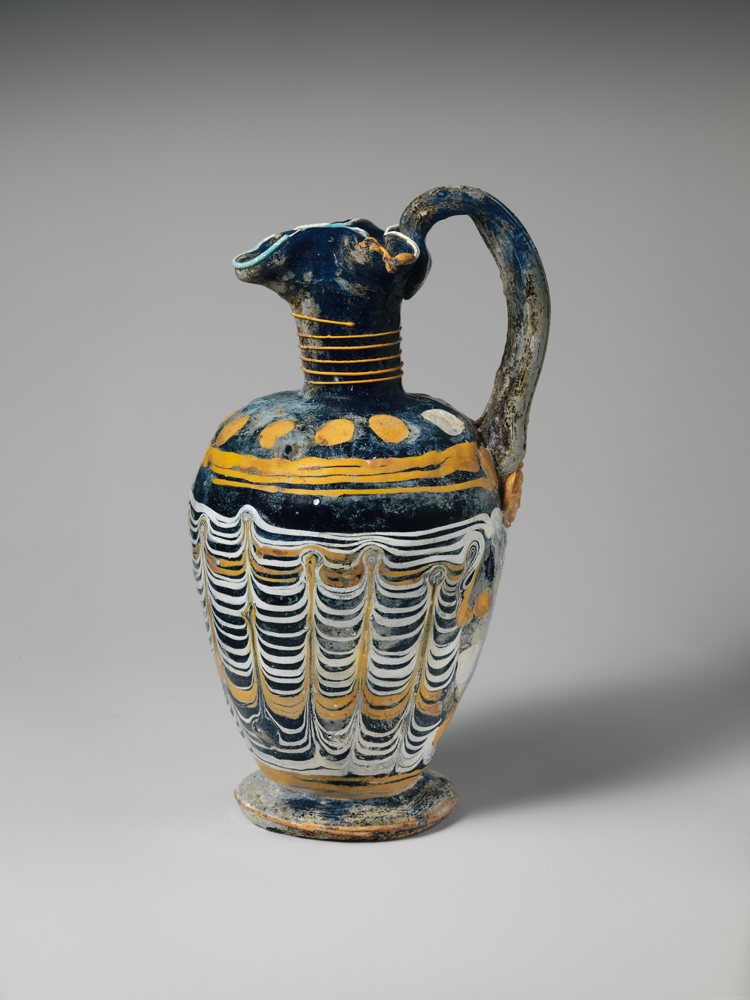

In [ ]:
from IPython.display import Image as IPythonImage, display

image_path = "/content/drive/My Drive/master_thesis_project/met_images/257880_primary.jpg"

# This definitely works in Colab
display(IPythonImage(filename=image_path, width=600))

Glass oinochoe.    
Glass.    
Classical or Hellenistic.     
Greek    
Translucent blue, with same color handle; trails and blobs in opaque yellow and pale turquoise; yellow appliqué at base of handle.Trefoil rim with slightly irregular shape to spout and tooling marks on upper surface around mouth and on underside of rim; cylindrical neck, slanting slightly forward; top of shoulder almost horizontal, then sloping and rounded; tall, ovoid body, tapering down to broad base pad with thick, rounded edge; hollow bottom; large rod handle applied to top edge of body, drawn up in a curving loop, turned in, and pressed on to back of rim.Turquoise trail around lip of rim, with one area of poorly applied yellow on one side; unmarvered fine yellow trail wound in a spiral 5½ times around neck; row of large blobs on shoulder, five in yellow, then five in turquoise; yellow trail around top edge of body in a spiral but coalescing in one area to form a broad single band; yellow and turquoise trail down sides of body, tooled into a festoon pattern with twelve upward tooling strokes (another upward and a single downward stroke are hidden behind and below handle); another yellow trail around bottom of body; another unmarvered yellow trail around edge of base; behind and below handle an additional patch of blue glass appears to have been applied and then decorated with rows of blobs; two in yellow to either side of base of handle, then four rows of three blobs (from top to bottom, a row of turquoise blobs, then yellow, then turquoise, then yellow to either side of a turquoise blob); a single blue blob on lower body over festoon; finally, a blob of yellow applied to base of handle and impressed with a female (Gorgon?) mask with long streaming hair and a ribbon (snakes?) under her chin.Broken and repaired, with minor losses to the trail on rim, some areas of fill, and some retouching; many large and deep pits; milky iridescent weathering; thick red encrustation inside mouth.The size of this core-formed glass jug is exceptional. The vast majority of surviving examples are relatively small by comparison. This piece can rightly be regarded as a tour-de-force, made as a special commission for someone who could afford to have only the best and biggest.

In [ ]:
# test 5: prompt + met images

image_sources = [
    "/content/drive/My Drive/master_thesis_project/met_images/257642_primary.jpg"
]

text_query = "Please provide the metadata (Material, Culture, Category) and a detailed description for this artifact."

print("Testing rank-based retrieval...")
result = rag.process_with_fine_tuned_models(image_sources, text_query)

print("\n" + "="*60)
print("FINAL ANALYSIS:")
print("="*60)
print(result['final_answer'])
print(f"\nStatistics: {result['retrieval_stats']['total_matches']} texts found, {result['retrieval_stats']['sources_used']} used")

Testing rank-based retrieval...
Loading image from file: /content/drive/My Drive/master_thesis_project/met_images/257642_primary.jpg
Processing 1 images with fine-tuned models...
Generated description for embedding: This artifact is a fragmentary sculpture of a female figure, likely from ancient Greece or the Roman period, based on its style. Here are the detailed observations:

**Form:**
- The sculpture is a partially preserved statue of a draped female figure.
- It is missing the head and arms, with a focus on the torso and lower body.
- The posture suggests a contrapposto stance, with weight shifted onto one leg, creating a naturalistic curve in the body's form.

**Decoration:**
- The figure is clad in a long, flowing garment (likely a peplos or chiton) that clings to the body, emphasizing the form underneath.
- The drapery is intricately carved, showing deep folds and a sense of movement, enhancing the overall lifelike appearance.
- The garment may have originally been painted or g

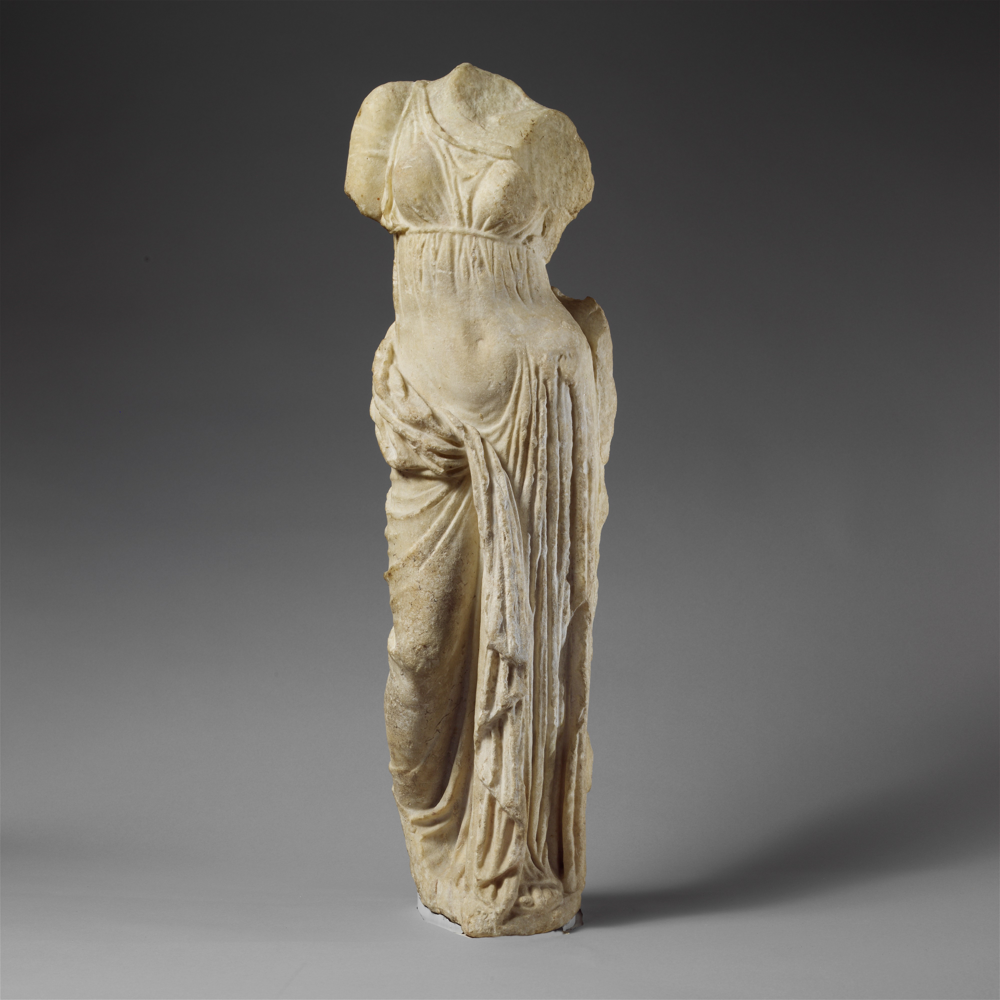

In [ ]:
image_path = "/content/drive/My Drive/master_thesis_project/met_images/257642_primary.jpg"

# This definitely works in Colab
display(IPythonImage(filename=image_path, width=600))

Marble statue of Aphrodite.   
marble.   
Hellenistic.  
Greek.  
Stone Sculpture.   
The goddess of love stands in an exaggerated hipshot pose. She wears a thin chiton girded just below the breasts, and her himation (cloak), which must have been draped over the missing left arm, falls in thick folds between her legs. This figure is one of the many variants created in the Hellenistic period of a statue type known as the Tiepolo Aphrodite. A major over-life-sized version and numerous statuettes have been found in Athens; many examples also come from the island of Rhodes.

In [ ]:
image_sources = [
    "/content/drive/My Drive/master_thesis_project/met_images/257603_primary.jpg"
]

text_query = "Please provide the metadata (Material, Culture, Category) and a detailed description for this artifact."

print("Testing rank-based retrieval...")
result = rag.process_with_fine_tuned_models(image_sources, text_query)

print("\n" + "="*60)
print("FINAL ANALYSIS:")
print("="*60)
print(result['final_answer'])
print(f"\nStatistics: {result['retrieval_stats']['total_matches']} texts found, {result['retrieval_stats']['sources_used']} used")

Testing rank-based retrieval...
Loading image from file: /content/drive/My Drive/master_thesis_project/met_images/257603_primary.jpg
Processing 1 images with fine-tuned models...
Generated description for embedding: This artifact is a sculpted head, likely from the classical Greek period given its style and material. Here’s a detailed description:

### Form
- **Shape**: It is a life-sized sculpted head.
- **Orientation**: The head is slightly tilted and turned, demonstrating a realistic posture.
- **Facial Features**: The face is classically idealized, with calm, serene expressions. Eyes are almond-shaped, the nose is straight and well-proportioned, and lips are full. The chin and jawline are softly modeled.

### Decoration
- **Hair**: The hair is stylized with detailed carving, tied in a classical manner typical of Greek sculptures, possibly suggesting the representation of a deity or a notable figure.
- **Details**: There is an emphasis on smooth planes and subtle transitions between

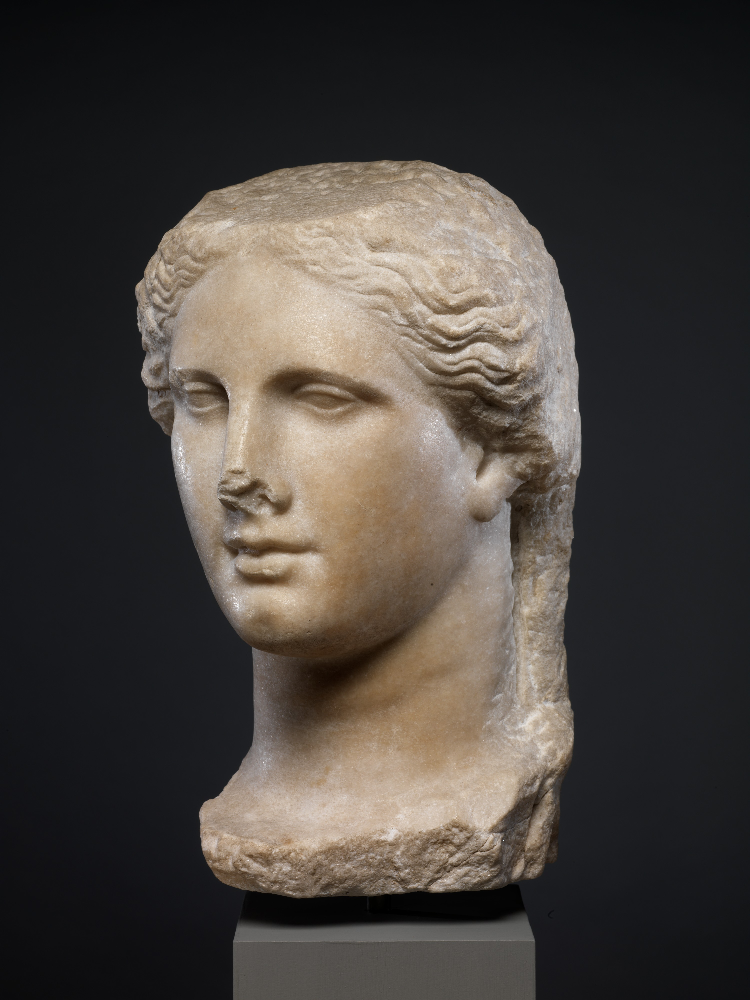

In [ ]:
image_path = "/content/drive/My Drive/master_thesis_project/met_images/257603_primary.jpg"

# This definitely works in Colab
display(IPythonImage(filename=image_path, width=600))

Marble head of a Ptolemaic queen.   
Marble.  
Hellenistic.   
Greek.   
Stone Sculpture.  
Acquired in Egypt by George Baldwin, British Consul-General 1785–96This monumental head gives an impression of sovereign calm and power, even though the veil that once covered the top and back of the head is now missing. Although the features are cast in a thoroughly classical style typical of the late fourth century B.C., the face is stamped with enough individuality to identify it as a portrait. In all probability, it represents a member of the Ptolemaic dynasty, that succession of Macedonian Greeks who ruled Egypt from the death of Alexander the Great in 323 B.C. until the annexation of Egypt by Rome and the suicide of Cleopatra VII in 30 B.C. Most recently, the head has been identified as Arsinoe II, who ruled together with her brother, Ptolemy II, from 278 B.C. until her death in 270 B.C. Not only was the queen part of a dynastic ruler cult during her life, she was also transformed into an independent deity by her brother after her death. She was worshiped as an Egyptian goddess in association with Isis and also separately as a Greek goddess, with her own sanctuaries and festivals. This strongly idealized head, which resembles classical images of Hera and Demeter, was probably associated with the latter cult.

In [ ]:
# test 7: prompt + met images

image_sources = [
    "/content/drive/My Drive/master_thesis_project/met_images/241199_primary.jpg"
]

text_query = "Please provide the metadata (Material, Culture, Category) and a detailed description for this artifact."

print("Testing rank-based retrieval...")
result = rag.process_with_fine_tuned_models(image_sources, text_query)

print("\n" + "="*60)
print("FINAL ANALYSIS:")
print("="*60)
print(result['final_answer'])
print(f"\nStatistics: {result['retrieval_stats']['total_matches']} texts found, {result['retrieval_stats']['sources_used']} used")

Testing rank-based retrieval...
Loading image from file: /content/drive/My Drive/master_thesis_project/met_images/241199_primary.jpg
Processing 1 images with fine-tuned models...
Generated description for embedding: This is a ceramic sculpture depicting two human figures, likely warriors, identifiable by the dynamic pose and accompanying accessories. Here’s a detailed description:

### Form:
- **Figures**: The sculpture includes two human forms. The figures appear to be in a kneeling or crouching position.
- **Posture**: One figure is holding a large, circular shield, possibly indicating a defensive stance, while the other figure seems to hold an object resembling a weapon or implement.
- **Headgear**: Both figures possess conical headgear, suggesting a cultural or ceremonial significance.

### Decoration:
- **Facial Features**: The faces of the figures are stylized with almond-shaped eyes and pronounced noses, likely indicative of a particular artistic tradition.
- **Body Decoration**

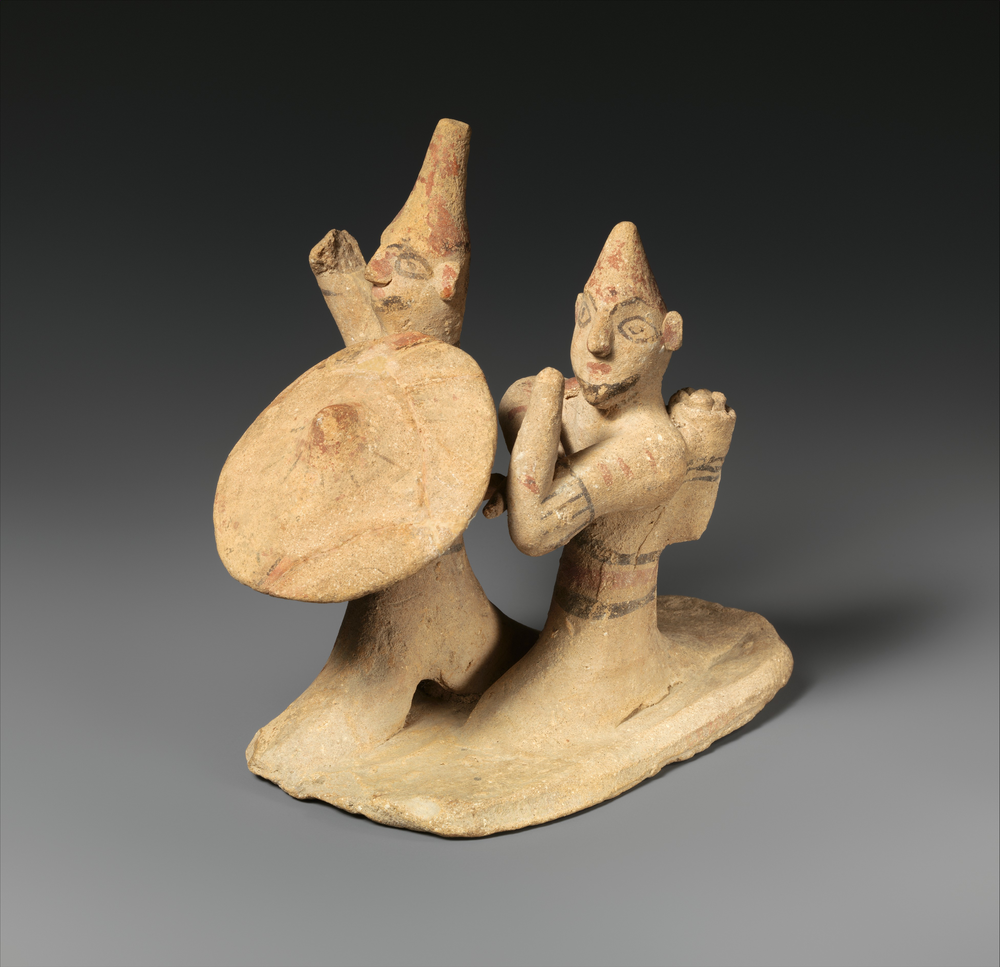

In [ ]:
image_path = "/content/drive/My Drive/master_thesis_project/met_images/241199_primary.jpg"

# This definitely works in Colab
display(IPythonImage(filename=image_path, width=600))

Terracotta warriors.    
Cypriot.     
This exceptional group shows a foot soldier, with conical helmet and round shield, beside an archer, with bow and quiver. Summary though it may be, the piece probably reflects political realities in Archaic Cyprus, which experienced successive domination by Assyria, Egypt, and Persian between the end of the eighth and the second half of the sixth century B.C.

In [6]:
# test 8: prompt + met images
config = Config()
rag = MultimodalRAG(config)

image_sources = [
    "/content/drive/My Drive/master_thesis_project/met_images/241220_primary.jpg"
]

text_query = "Please provide the metadata (Material, Culture, Category) and a detailed description for this artifact."

print("Testing rank-based retrieval...")
result = rag.process_with_fine_tuned_models(image_sources, text_query)

print("\n" + "="*60)
print("FINAL ANALYSIS:")
print("="*60)
print(result['final_answer'])
print(f"\nStatistics: {result['retrieval_stats']['total_matches']} texts found, {result['retrieval_stats']['sources_used']} used")

Loading pre-computed bibliography embeddings...
Loading metadata and creating chunk_id mapping...
Loading original chunks file...
Loaded 258792 bibliography embeddings
Loaded 258792 original chunks
Created mapping for 17366 chunk_ids to embeddings
Created mapping for 17366 chunk_ids to texts
Using OpenAI text-embedding-3-large with 3072 dimensions
Mapping verification: 99/100 embeddings successfully mapped to texts
Testing rank-based retrieval...
Loading image from file: /content/drive/My Drive/master_thesis_project/met_images/241220_primary.jpg
Processing 1 images with fine-tuned models...
Generated description for embedding: This artifact is a sculptural representation of a mounted rider on horseback, made from terracotta. The form showcases a rider dressed in attire typical of a horseman, possibly indicative of specific cultural or historical contexts. The figure is depicted wearing a pointed cap and a cloak, which are notable features for identifying its origin and period. The hors

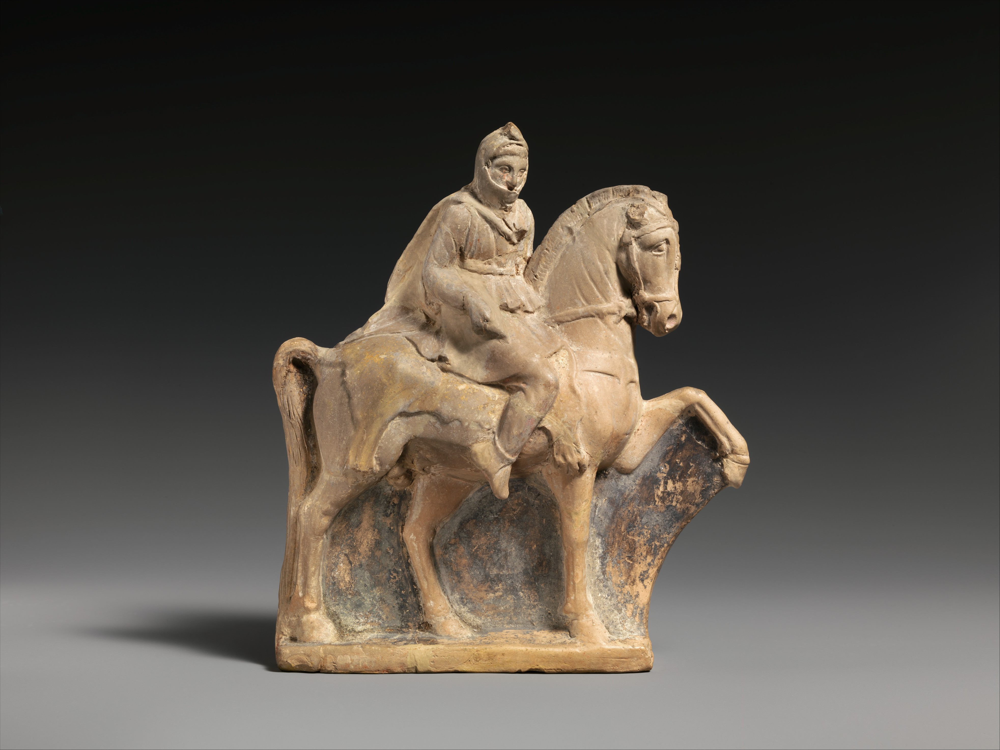

In [10]:
from IPython.display import Image, display

image_path = "/content/drive/My Drive/master_thesis_project/met_images/241220_primary.jpg"

# This definitely works in Colab
display(Image(filename=image_path, width=600))

Terracotta.
Cypriot.
Terracottas
Numerous equestrian figurines have been found on Cyprus; they represent a variety of figures, including the Dioskouroi, Amazons, and Phrygian riders. This example appears to depict a horseman in Persian dress, similar to that shown on the famous Alexander Mosaic from the House of the Faun at Pompeii.

In [6]:
# test 9: prompt + met images
config = Config()
rag = MultimodalRAG(config)

image_sources = [
    "/content/drive/My Drive/master_thesis_project/met_images/241873_primary.jpg"
]

text_query = "Please provide the metadata (Material, Culture, Category) and a detailed description for this artifact."

print("Testing rank-based retrieval...")
result = rag.process_with_fine_tuned_models(image_sources, text_query)

print("\n" + "="*60)
print("FINAL ANALYSIS:")
print("="*60)
print(result['final_answer'])
print(f"\nStatistics: {result['retrieval_stats']['total_matches']} texts found, {result['retrieval_stats']['sources_used']} used")

Loading pre-computed bibliography embeddings...
Loading metadata and creating chunk_id mapping...
Loading original chunks file...
Loaded 258792 bibliography embeddings
Loaded 258792 original chunks
Created mapping for 17366 chunk_ids to embeddings
Created mapping for 17366 chunk_ids to texts
Using OpenAI text-embedding-3-large with 3072 dimensions
Mapping verification: 99/100 embeddings successfully mapped to texts
Testing rank-based retrieval...
Loading image from file: /content/drive/My Drive/master_thesis_project/met_images/241873_primary.jpg
Processing 1 images with fine-tuned models...
Generated description for embedding: This artifact is a sculptural relief carved into a limestone block. The form resembles a small altar or shrine with a broad base and a slightly narrower top. The upper surface appears flattened, indicating it might have been used to hold offerings or as a part of ceremonial practices.

### Form:
- The object is roughly rectangular, tapering slightly towards the t

In [15]:
image_path = "/content/drive/My Drive/master_thesis_project/met_images/241873_primary.jpg"

# This definitely works in Colab
display(Image(filename=image_path, width=600))

Output hidden; open in https://colab.research.google.com to view.

Limestone altar.   
Cypriot.  
Cesnola Inscriptions.   
The altar is decorated on two sides; on one, together with a Cypro-syllabic inscription, is a sacrifice scene; on the other a couple are shown at a banquet.

In [7]:
# test 10: prompt + met images
image_sources = [
    "https://huggingface.co/datasets/Huan3/met_artefacts_images/resolve/main/256008_primary.jpg",
]

text_query = "Please provide the metadata (Material, Culture, Category) and a detailed description for this artifact."

print("Testing rank-based retrieval...")
result = rag.process_with_fine_tuned_models(image_sources, text_query)

print("\n" + "="*60)
print("FINAL ANALYSIS:")
print("="*60)
print(result['final_answer'])
print(f"\nStatistics: {result['retrieval_stats']['total_matches']} texts found, {result['retrieval_stats']['sources_used']} used")

Testing rank-based retrieval...
Loading image from URL: https://huggingface.co/datasets/Huan3/met_artefacts_images/resolve/main/256008_primary.jpg
Processing 1 images with fine-tuned models...
Generated description for embedding: This artifact appears to be a type of fibula, which is a brooch or pin used in ancient times to fasten garments. Here are the notable details:

**Form:**
- The fibula is composed of a single piece of metal, intricately twisted.
- It has a distinctive shape, with one end tapering to a point, likely used for fastening.

**Decoration:**
- The fibula appears fairly plain, with its primary decoration being in its twisted form rather than any engraved patterns or added embellishments.

**Materials:**
- It is made of metal, likely bronze, given the patina.
- The surface exhibits a green patina, a common feature for aged bronze artifacts due to oxidation.

**Condition:**
- The artifact shows signs of corrosion, as indicated by the patina and surface degradation.
- Des

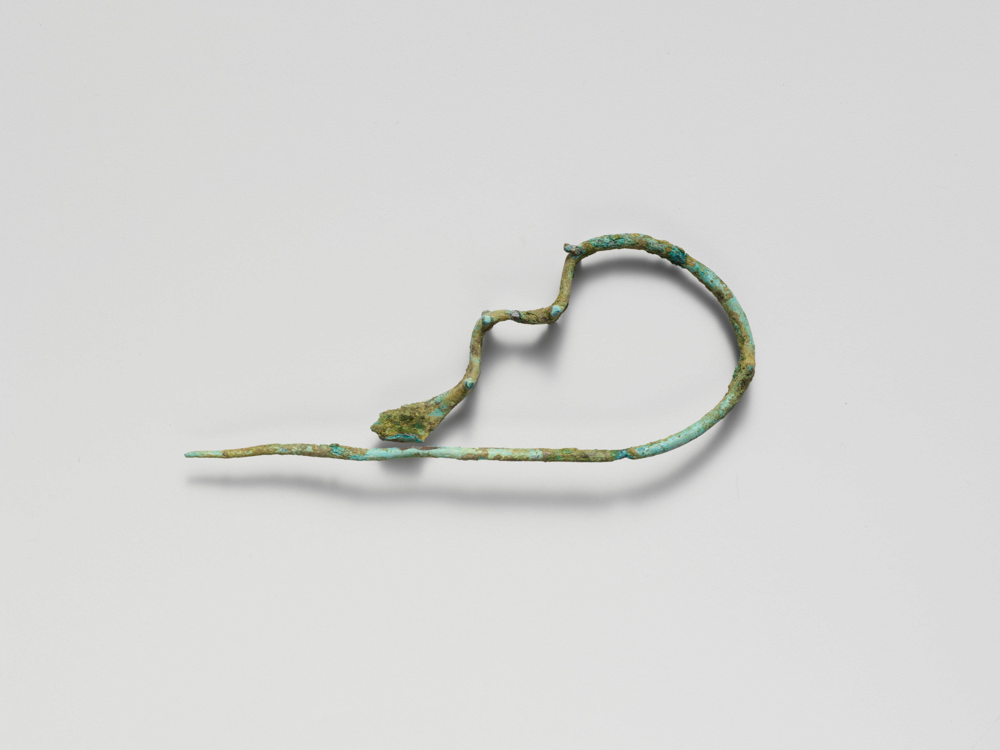

In [14]:
image_path = "/content/drive/My Drive/master_thesis_project/met_images/256008_primary.jpg"

# This definitely works in Colab
display(Image(filename=image_path, width=600))

Bronze dragon-type fibula.  
Bronze.   
Villanovan.   
Bronzes.   
Dragon-type fibulae are a later variant of the serpentine type.

In [8]:
# test 11: prompt + met images

image_sources = [
    "/content/drive/My Drive/master_thesis_project/met_images/248182_primary.jpg",
]

text_query = "Please provide the metadata (Material, Culture, Category) and a detailed description for this artifact."

print("Testing rank-based retrieval...")
result = rag.process_with_fine_tuned_models(image_sources, text_query)

print("\n" + "="*60)
print("FINAL ANALYSIS:")
print("="*60)
print(result['final_answer'])
print(f"\nStatistics: {result['retrieval_stats']['total_matches']} texts found, {result['retrieval_stats']['sources_used']} used")

Testing rank-based retrieval...
Loading image from file: /content/drive/My Drive/master_thesis_project/met_images/248182_primary.jpg
Processing 1 images with fine-tuned models...
Generated description for embedding: The artifact is a Greek lekythos, a type of vessel commonly used for storing oil, especially olive oil, often used in funeral rites. Here’s a detailed description:

### Form:
- **Shape**: The lekythos has a cylindrical body with a narrow neck and a wide mouth, suitable for pouring. It also features a single handle connecting the neck to the shoulder.
- **Base**: The vessel has a small, disk-shaped base, providing stability.

### Decoration:
- **Surface Decoration**: The lekythos is adorned with a white ground technique, allowing for intricate and colorful designs.
- **Figures**: The imagery includes a central human figure, possibly a mythological or everyday scene, which was common in Greek pottery.
- **Color**: The decoration features colors such as red, black, and other e

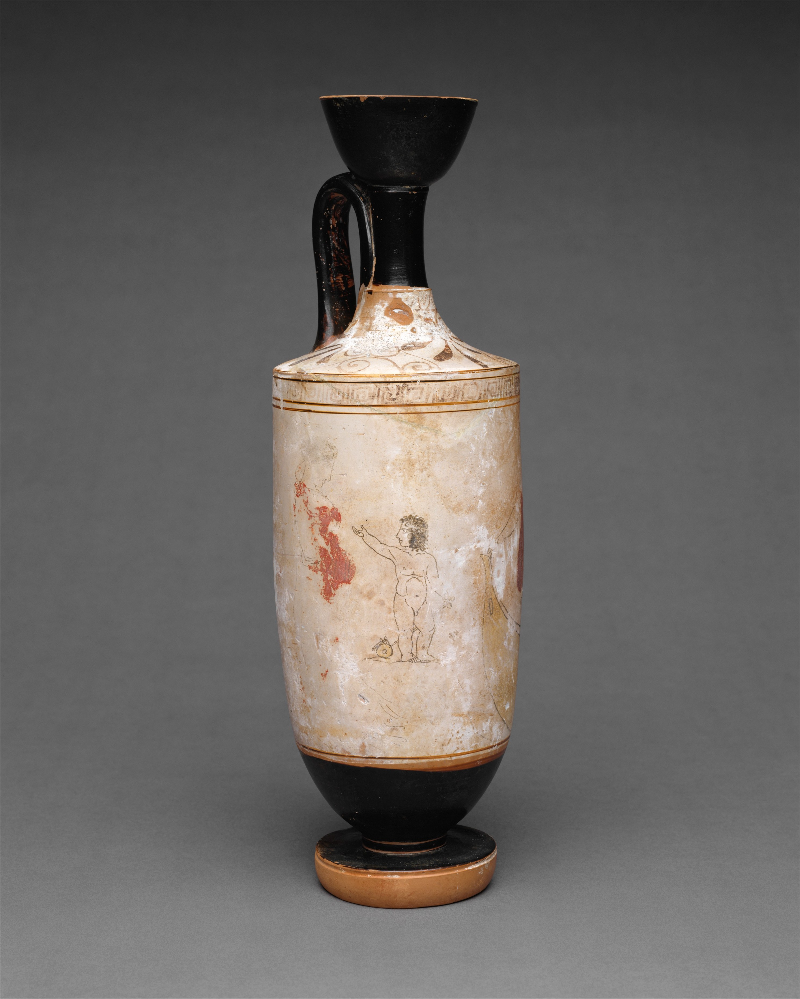

In [13]:
from IPython.display import Image

image_path = "/content/drive/My Drive/master_thesis_project/met_images/248182_primary.jpg"

# This definitely works in Colab
display(Image(filename=image_path, width=600))

Terracotta lekythos (oil flask).   
Terracotta.   
Greek, Attic.   
Vases.    
Mother, boy, and CharonCharon, the ferryman, transported the deceased across the river separating the world of the living from that of the dead. The reality of this journey to the ancient Greeks is reflected in the many representations of Charon and his charges. Here he awaits a woman and a little boy who is undoubtedly the deceased. The child is elevated on a rock and motions to his mother with one hand while holding his go-cart with the other.

In [12]:
# test 12: prompt + met images
image_sources = [
    "/content/drive/My Drive/master_thesis_project/met_images/248309_primary.jpg",
]

text_query = "Please provide the metadata (Material, Culture, Category) and a detailed description for this artifact."

print("Testing rank-based retrieval...")
result = rag.process_with_fine_tuned_models(image_sources, text_query)

print("\n" + "="*60)
print("FINAL ANALYSIS:")
print("="*60)
print(result['final_answer'])
print(f"\nStatistics: {result['retrieval_stats']['total_matches']} texts found, {result['retrieval_stats']['sources_used']} used")

Testing rank-based retrieval...
Loading image from file: /content/drive/My Drive/master_thesis_project/met_images/248309_primary.jpg
Processing 1 images with fine-tuned models...
Generated description for embedding: This archaeological artifact is a classical sculpture, likely from ancient Greece or Rome, depicting a draped female figure. Here are the details:

**Form:**
- The statue represents a standing female figure, possibly a goddess or significant woman from mythology or society.
- It is carved in a contrapposto stance, with weight shifted onto one leg, giving a sense of movement.

**Decoration:**
- The drapery is intricately carved, indicating movement and texture. The garment features elegant folds and may represent a chiton or peplos commonly worn in ancient times.
- Despite some damage, the detailing on the robe suggests careful attention to realism in depicting textiles.

**Materials and Condition:**
- The sculpture is made from marble, a common material in classical sculptu

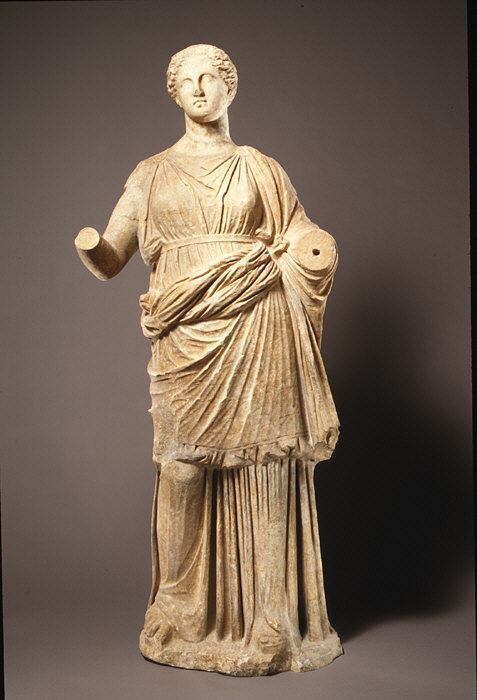

In [17]:
image_path = "/content/drive/My Drive/master_thesis_project/met_images/248309_primary.jpg"

# This definitely works in Colab
display(Image(filename=image_path, width=600))

Marble, Pentelic.      
Greek, Attic.     
Stone Sculpture.    
This large figure probably was part of a group of funerary statues that were placed within a deep, covered niche. The back of the drapery is not carefully finished as it would not have been visible. The production of such elaborate grave monuments with large-scale statues came to an end in Attica in 317 or 307 B.C. when Demetrios of Phaleron, the governor of Athens, issued a law prohibiting ostentatious display by wealthy families.

In [9]:
# test 13: prompt + met images
image_sources = [
    "/content/drive/My Drive/master_thesis_project/met_images/248779_primary.jpg",
]

text_query = "Please provide the metadata (Material, Culture, Category) and a detailed description for this artifact."

print("Testing rank-based retrieval...")
result = rag.process_with_fine_tuned_models(image_sources, text_query)

print("\n" + "="*60)
print("FINAL ANALYSIS:")
print("="*60)
print(result['final_answer'])
print(f"\nStatistics: {result['retrieval_stats']['total_matches']} texts found, {result['retrieval_stats']['sources_used']} used")

Testing rank-based retrieval...
Loading image from file: /content/drive/My Drive/master_thesis_project/met_images/248779_primary.jpg
Processing 1 images with fine-tuned models...
Generated description for embedding: This artifact is a necklace displaying distinct features indicative of a particular cultural or historical period. Here's a detailed description:

**Form:**
- The necklace is circular and composed of numerous individual components strung together.
- It features pendants of varying shapes and sizes attached to the main strand, providing a dynamic silhouette.

**Decoration:**
- The pendants include rounded discs and crescent shapes, all intricately decorated.
- The discs show a central motif, potentially floral or geometric, surrounded by radial patterns.
- The crescents are embellished with raised patterns that could represent stylized faces or abstract designs.

**Materials:**
- The necklace appears to be made from metal, likely gold or a gold alloy, given the sheen and pat

In [18]:
image_path = "/content/drive/My Drive/master_thesis_project/met_images/248779_primary.jpg"

# This definitely works in Colab
display(Image(filename=image_path, width=600))

Output hidden; open in https://colab.research.google.com to view.

Gold, amber.    
Etrusco-Phoenician.    
Gold and Silver.   
Amber inlay in pendant.

In [11]:
# test 14: prompt + met images
image_sources = [
    "/content/drive/My Drive/master_thesis_project/met_images/248800_primary.jpg",
]

text_query = "Please provide the metadata (Material, Culture, Category) and a detailed description for this artifact."

print("Testing rank-based retrieval...")
result = rag.process_with_fine_tuned_models(image_sources, text_query)

print("\n" + "="*60)
print("FINAL ANALYSIS:")
print("="*60)
print(result['final_answer'])
print(f"\nStatistics: {result['retrieval_stats']['total_matches']} texts found, {result['retrieval_stats']['sources_used']} used")

Testing rank-based retrieval...
Loading image from file: /content/drive/My Drive/master_thesis_project/met_images/248800_primary.jpg
Processing 1 images with fine-tuned models...
Generated description for embedding: This artifact is a marble bust, likely representing a Roman male figure. Here's a detailed description:

**Form:**
- The artifact is a sculpted head, portraying a mature male with realistic facial features.
- It is depicted in a frontal pose with detailed attention to the hair, eyes, and facial structure.

**Decoration:**
- The hair is styled in a manner typical of Roman sculptures, with distinct, combed waves that were likely fashionable during the period.
- The eyes are hollow, suggesting the presence of once-inlaid materials that may have depicted the irises.
- The face exhibits a realistic portrayal with lines and contours indicating age and expression.

**Materials:**
- The entire piece is carved from marble, a common medium for Roman statuary, known for its durability

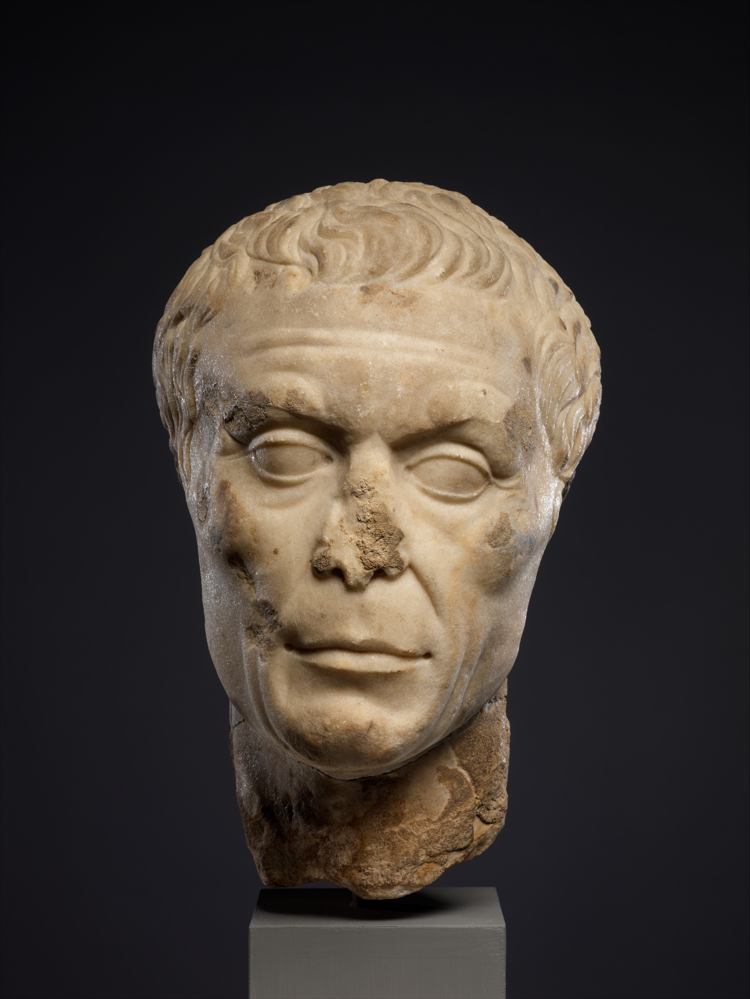

In [20]:
image_path = "/content/drive/My Drive/master_thesis_project/met_images/248800_primary.jpg"

# This definitely works in Colab
display(Image(filename=image_path, width=600))

Marble.   
Roman.  
Stone Sculpture.   
The head is turned toward its left and slightly raised, in an echo of late Hellenistic pathos. It particularly resembles the portrait of the deified Caesar, especially the serene, later version of that work, which must have been created after the rule of Augustus was established, thus after 27 B.C.

> `Add blockquote`



In [10]:
# test 15: prompt + met images
image_sources = [
    "/content/drive/My Drive/master_thesis_project/met_images/248924_primary.jpg",
]

text_query = "Please provide the metadata (Material, Culture, Category) and a detailed description for this artifact."

print("Testing rank-based retrieval...")
result = rag.process_with_fine_tuned_models(image_sources, text_query)

print("\n" + "="*60)
print("FINAL ANALYSIS:")
print("="*60)
print(result['final_answer'])
print(f"\nStatistics: {result['retrieval_stats']['total_matches']} texts found, {result['retrieval_stats']['sources_used']} used")

Testing rank-based retrieval...
Loading image from file: /content/drive/My Drive/master_thesis_project/met_images/248924_primary.jpg
Processing 1 images with fine-tuned models...
Generated description for embedding: This artifact is an ancient glass bowl, notable for its hemispherical form and relatively uniform shape. It has a rounded, smooth rim, a shallow depth, and a small, slightly elevated base. The translucent material indicates it is made of glass, exhibiting an amber or golden-brown hue. The surface shows signs of iridescence, a feature often caused by weathering over centuries, hinting at its antiquity.

The bowl's surface has areas of wear and minor pitting, as commonly seen in aged glass artifacts. Some white encrustations and deterioration are visible, which could suggest burial corrosion. These characteristics are essential for dating and identifying its provenance, as well as understanding the conditions it has been subjected to.

The simplicity in form suggests function

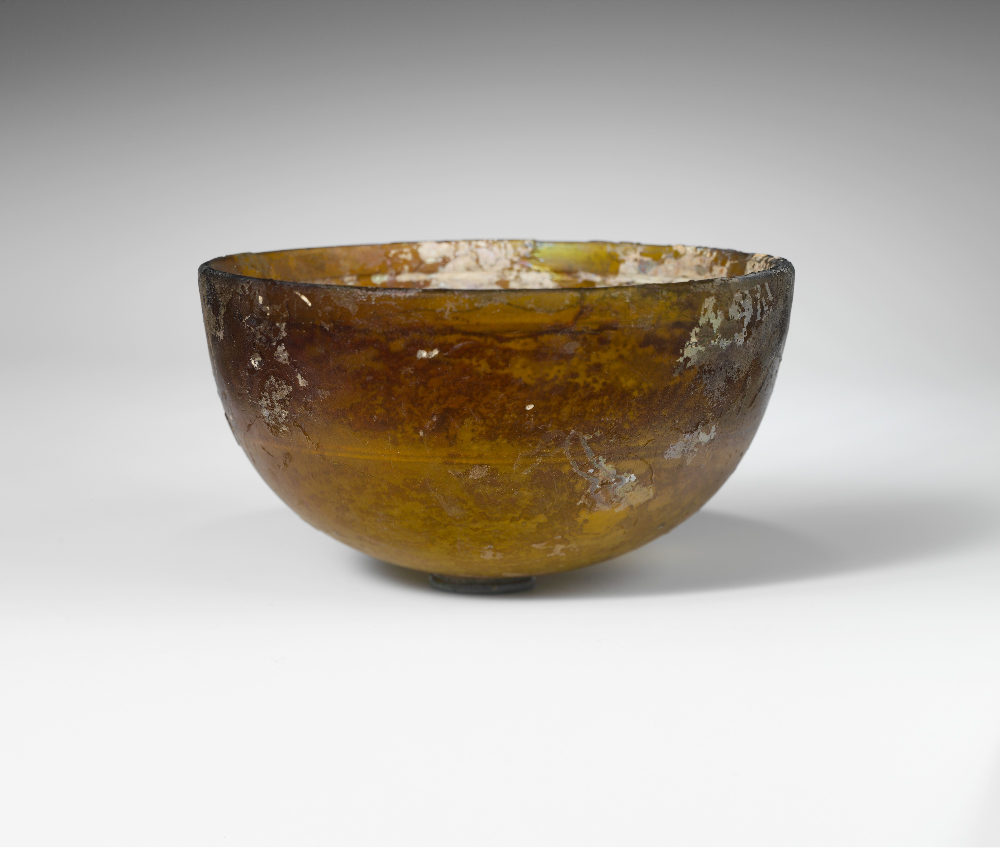

In [19]:
image_path = "/content/drive/My Drive/master_thesis_project/met_images/248924_primary.jpg"

# This definitely works in Colab
display(Image(filename=image_path, width=600))

Glass.   
Greek.   
Glass.   
Translucent golden brown.Vertical rim with rounded edge; convex curving side; convex bottom.On interior, a single broad horizontal groove below rim, and two narrow horizontal grooves in a band halfway down side.Intact; some pinprick bubbles; deep pitting, dulling, and patches of iridescent weathering on exterior, and creamy brown weathering covering most of interior.